# Scrapper to get the list of all Migration agents registered with MARA

from the page: https://www.mara.gov.au/search-the-register-of-migration-agents/

In [200]:
import requests
import pandas
from pandas.io.json import json_normalize

agentsNumber = '20000' # we want to get all agents
response = requests.get('https://www.mara.gov.au/api/agentsearch?DelimitedStartWithLetterFilter%5BFieldName%5D=Name.FamilyName&DelimitedStartWithLetterFilter%5BLetterString%5D=&DelimitedStartWithLetterFilter%5BLabel%5D=Show+All&DelimitedStartWithLetterFilter%5BIsSelected%5D=false&DelimitedStartWithLetterFilter%5BContainsData%5D=true&Keyword=&Location=&BusinessName=&IsNoFee=&IsPractitioner=&AgentFamilyName=&AgentGivenName=&AgentName=&AgentMARN=&SortInfo%5BSortField%5D=&SortInfo%5BIsAscending%5D=false&PagingInfo%5BPageIndex%5D=0&PagingInfo%5BPageSize%5D=' + agentsNumber)
data = response.json()
# data

# Now we need to Clean the data and create a DataFrame

In [201]:
# We can't do a one line loop because of the NoneType of some row
# state = [ x['DisplayBusiness']['Address']['State'] for x in data['Result'] ]

agents_with_state = []
state_count = {}
agents = 0

# let's loop on each agents and get the state and check the type of DisplayBusiness
for agent in data["Result"]:
    if agent['DisplayBusiness'] is not None:
        if agent['DisplayBusiness']['Address']:
            state = agent['DisplayBusiness']['Address']['State']
            if state is not None:
                agents = agents + 1
                # we are already looping on the agents list so let's do a count here
                if state in state_count:
                    state_count[state] = state_count[state] + 1
                else:
                    state_count[state] = 1

                # I am keeping this other dictionary for another work later on
                agents_with_state.append({ 'Name': agent['DisplayBusiness']['Name'], 'State': state })

# state_count
agents_df = pandas.DataFrame(data=list(state_count.items()), columns=['State', 'Agents_Count'])
agents_df

,State,Agents_Count
0,NSW,2566
1,QLD,852
2,VIC,2067
3,WA,626
4,TAS,33
5,SA,289
6,ACT,104
7,NT,28


In [202]:
agents_df.set_index(['State'], inplace = True)
agents_df

,Agents_Count
State,
NSW,2566
QLD,852
VIC,2067
WA,626
TAS,33
SA,289
ACT,104
NT,28


# Let's visualize with a plot bar graph

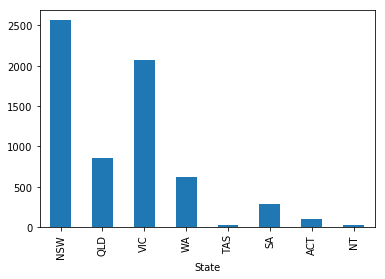

In [203]:
%matplotlib inline
import matplotlib
agents_df.Agents_Count.plot.bar()

# From number to %

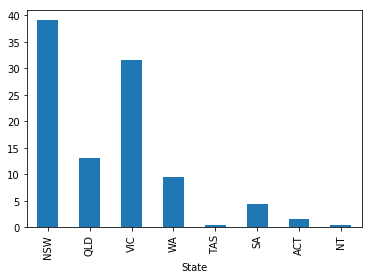

In [204]:
agents_df['% Agents'] = (agents_df['Agents_Count'] / agents) * 100
agents_df['% Agents'].plot.bar()

# Let's get the number of Migrants per state

In [205]:
migrants_per_state_url = 'http://www.abs.gov.au/ausstats/abs@.nsf/Latestproducts/3412.0Main%20Features52014-15?opendocument&tabname=Summary&prodno=3412.0&issue=2014-15&num=&view='

migrants_per_state = pandas.read_html(migrants_per_state_url)[1]
migrants_per_state

,0,1,2,3,4,5,6,7,8,9,...,262,263,264,265,266,267,268,269,270,271
0,"Page tools: .mffeedback,#pjs { display :none; ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Summary In this issue Australia's Population b...,Please enable javascript to see the dynamic gr...,NaN,NaN,"2.2 NOM, Selected characteristics - State & te...",NaN,NaN,NOM,NOM ARRIVALS,NOM DEPARTURES,...,100.0,287 790,100.0,186 365,100.0,NaN,(a) The visa category information in this tabl...,"(b) Visitor visas include tourists, business v...",(c) Includes residents returning (i.e. non Aus...,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"2.2 NOM, Selected characteristics - State & te...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NOM,NOM ARRIVALS,NOM DEPARTURES,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,Overseas arrivals,Median age,Sex ratio(b),Overseas departures,Median age,Sex ratio(b),NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,State or territory,no.,%,no.,years,ratio,no.,years,ratio,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NSW,66 086,39.3,167 150,26.8,99.8,101 064,29.1,101.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Shaving the yack

In [206]:
# migrants_per_state.set_index([1], inplace = True)
percentages_list = []
states_list = []

migrant_by_state_dic = {};

for x in range(0, 8):
    state = migrants_per_state[0][9 + x].replace('.', '').upper();
    percentage = migrants_per_state[2][9 + x];
    states_list.append(state)
    percentages_list.append(percentage)
    migrant_by_state_dic[state] = percentage
    
migrants_per_state_df = pandas.DataFrame(data=list(migrant_by_state_dic.items()), columns=['State', 'Migrants_Count'])
migrants_per_state_df.set_index(['State'], inplace = True)
migrants_per_state_df

,Migrants_Count
State,
NSW,39.3
VIC,32.1
QLD,11.3
SA,6.2
WA,8.4
TAS,0.6
NT,0.6
ACT,1.4


# Let's visualise the new data

In [207]:
# Convert object type to float
migrants_per_state_df['Migrants_Count'] = migrants_per_state_df['Migrants_Count'].astype(str).astype(float)

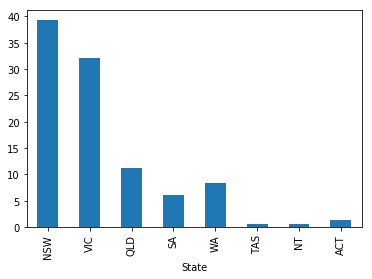

In [208]:
migrants_per_state_df['Migrants_Count'].plot.bar()

# Let's merge the dataframe

In [210]:
agents_df['% Migrants'] = migrants_per_state_df['Migrants_Count']
agents_df

,Agents_Count,% Agents,% Migrants
State,,,
NSW,2566,39.086062,39.3
QLD,852,12.977913,11.3
VIC,2067,31.485149,32.1
WA,626,9.535415,8.4
TAS,33,0.502666,0.6
SA,289,4.402133,6.2
ACT,104,1.584158,1.4
NT,28,0.426504,0.6


# Visualisation of the new dataframe

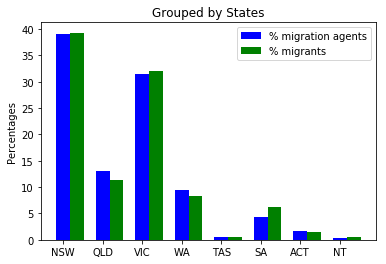

In [223]:
import matplotlib.pyplot as plt
import numpy as np

N = 8
ind = np.arange(N)  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(ind, agents_df['% Agents'] , width, color='b')
rects2 = ax.bar(ind + width, agents_df['% Migrants'], width, color='g')

ax.legend((rects1[0], rects2[0]), ('% migration agents', '% migrants'))
ax.set_xticklabels(('', 'NSW', 'QLD', 'VIC', 'WA', 'TAS', 'SA', 'ACT', 'NT'))
ax.set_ylabel('Percentages')
ax.set_title('Grouped by States')

plt.show()
# agents_df.index

# Other cleanup process for the entire set of data

## Using a recusive function to flatten an object of arbitrary structure

In [5]:
def flatten_json(y):
    out = {}

    def flatten(x, name=''):
        if type(x) is dict:
            for a in x:
                flatten(x[a], name + a + '_')
        elif type(x) is list:
            i = 0
            for a in x:
                flatten(a, name + str(i) + '_')
                i += 1
        else:
            out[str(name[:-1])] = str(x)

    flatten(y)
    return out

In [16]:
data["Result"][0]

{'Aliases': [],
 'ApplicantReferenceID': None,
 'CitizenshipCountries': ['Australia', 'Philippines'],
 'ContactId': '5a7f1ab0-a452-e311-9402-005056ab0eca',
 'CurrentSanctionOutcome': None,
 'CurrentSanctionOutcome2': None,
 'DisplayBusiness': {'ABN': '41168886235',
  'Address': {'AddressLine1': 'Suite 107, Level 1, 18-20 Ross Street',
   'AddressLine2': None,
   'AddressLine3': None,
   'Country': 'Australia',
   'FullAddress': 'Suite 107, Level 1, 18-20 Ross Street\r\nPARRAMATTA NSW 2150\r\nAustralia',
   'Latitude': -28.86555,
   'Longitude': 153.5679,
   'OtherPostCode': None,
   'OtherState': None,
   'OtherSuburb': None,
   'PostCode': '2150',
   'State': 'NSW',
   'Suburb': 'PARRAMATTA'},
  'BusinessClassification': 'Registered Migration Agent',
  'BusinessClassificationCode': 'RMA',
  'BusinessId': '0a8ecfaf-302a-401c-a2a6-4caf11203ee9',
  'BusinessType': 'Company',
  'CID': '8258657694894',
  'CRN': '82586576948945',
  'ChangesInNameDetail': None,
  'ConnectedAgents': [],
  'Co

In [6]:
flat = flatten_json(data["Result"][0])
flat
# json_normalize(flatten_json(data["Result"][0]))

{'Aliases': '[]',
 'ApplicantReferenceID': 'None',
 'CitizenshipCountries': "['Australia', 'Philippines']",
 'ContactId': '5a7f1ab0-a452-e311-9402-005056ab0eca',
 'CurrentSanctionOutcome': 'None',
 'CurrentSanctionOutcome2': 'None',
 'DisplayBusiness_ABN': '41168886235',
 'DisplayBusiness_Address_AddressLine1': 'Suite 107, Level 1, 18-20 Ross Street',
 'DisplayBusiness_Address_AddressLine2': 'None',
 'DisplayBusiness_Address_AddressLine3': 'None',
 'DisplayBusiness_Address_Country': 'Australia',
 'DisplayBusiness_Address_FullAddress': 'Suite 107, Level 1, 18-20 Ross Street\r\nPARRAMATTA NSW 2150\r\nAustralia',
 'DisplayBusiness_Address_Latitude': '-28.86555',
 'DisplayBusiness_Address_Longitude': '153.5679',
 'DisplayBusiness_Address_OtherPostCode': 'None',
 'DisplayBusiness_Address_OtherState': 'None',
 'DisplayBusiness_Address_OtherSuburb': 'None',
 'DisplayBusiness_Address_PostCode': '2150',
 'DisplayBusiness_Address_State': 'NSW',
 'DisplayBusiness_Address_Suburb': 'PARRAMATTA',
 '

In [8]:
newData = json_normalize(flat)
newData

,Aliases,ApplicantReferenceID,CitizenshipCountries,ContactId,CurrentSanctionOutcome,CurrentSanctionOutcome2,DisplayBusiness_ABN,DisplayBusiness_Address_AddressLine1,DisplayBusiness_Address_AddressLine2,DisplayBusiness_Address_AddressLine3,...,PrimaryBusiness_PostalAddress_OtherSuburb,PrimaryBusiness_PostalAddress_PostCode,PrimaryBusiness_PostalAddress_State,PrimaryBusiness_PostalAddress_Suburb,PrimaryBusiness_PrimaryContactId,PrimaryBusiness_Relationship,PrimaryBusiness_VerifiedDocuments,PrimaryBusiness_WebsiteUrl,SanctionedDate,SecondaryBusinesses
0,[],None,"['Australia', 'Philippines']",5a7f1ab0-a452-e311-9402-005056ab0eca,None,None,41168886235,"Suite 107, Level 1, 18-20 Ross Street",None,None,...,None,None,None,None,None,Employee,None,None,None,[]


In [9]:
# json_normalize(data['Result'], '', 'ContactId')

# json_normalize(data, 'Result', ['PrimaryBusiness_Name', 'ContactId', 'DisplayBusiness_ABN'])
json_normalize(data=data['Result'] )

# state = [ x['CitizenshipCountries_0'] for x in flat ]

,Aliases,ApplicantReferenceID,CitizenshipCountries,ContactId,CurrentSanctionOutcome,CurrentSanctionOutcome.CaseId,CurrentSanctionOutcome.CaseOutcomeId,CurrentSanctionOutcome.CaseOutcomeReferenceNo,CurrentSanctionOutcome.ContactId,CurrentSanctionOutcome.DateAppealLodged,...,PrimaryBusiness.PostalAddress.OtherSuburb,PrimaryBusiness.PostalAddress.PostCode,PrimaryBusiness.PostalAddress.State,PrimaryBusiness.PostalAddress.Suburb,PrimaryBusiness.PrimaryContactId,PrimaryBusiness.Relationship,PrimaryBusiness.VerifiedDocuments,PrimaryBusiness.WebsiteUrl,SanctionedDate,SecondaryBusinesses
0,[],None,"[Australia, Philippines]",5a7f1ab0-a452-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Employee,NaN,None,None,[]
1,[],None,[Australia],593142cf-a052-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,BRISBANE,NaN,Partner,NaN,None,None,[]
2,[],None,[Australia],7b06f2ea-a152-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,SUNNYBANK HILLS,NaN,Director,NaN,None,None,[]
3,[],None,[Australia],3332e959-a152-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PARRAMATTA,NaN,Employee,NaN,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
4,[],None,[South Africa],a2473195-d586-e611-9403-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Director,NaN,None,None,[]
5,[],None,[Sri Lanka],34d2cfb0-209f-e611-9403-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Owner,NaN,None,None,[]
6,[],None,"[Australia, Pakistan]",4807935a-29a8-e411-9403-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Owner,NaN,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
7,[],None,[Australia],790b9e0e-a352-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,MEADOW HEIGHTS,NaN,Owner,NaN,None,None,[]
8,[],None,"[Australia, Iran, Islamic Republic of]",34e22935-a552-e311-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Owner,NaN,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
9,[],None,[Australia],55d826c3-173b-e411-9402-005056ab0eca,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,None,NaN,Owner,NaN,None,None,"[{'Relationship': 'Director', 'IsPrimary': Fal..."


In [10]:
agentsFlat = []
for agentFlat in data["Result"]:
    agentsFlat.append(flatten_json(agentFlat))
    
# agentsFlat

[{'Aliases': '[]',
  'ApplicantReferenceID': 'None',
  'CitizenshipCountries': "['Australia', 'Philippines']",
  'ContactId': '5a7f1ab0-a452-e311-9402-005056ab0eca',
  'CurrentSanctionOutcome': 'None',
  'CurrentSanctionOutcome2': 'None',
  'DisplayBusiness_ABN': '41168886235',
  'DisplayBusiness_Address_AddressLine1': 'Suite 107, Level 1, 18-20 Ross Street',
  'DisplayBusiness_Address_AddressLine2': 'None',
  'DisplayBusiness_Address_AddressLine3': 'None',
  'DisplayBusiness_Address_Country': 'Australia',
  'DisplayBusiness_Address_FullAddress': 'Suite 107, Level 1, 18-20 Ross Street\r\nPARRAMATTA NSW 2150\r\nAustralia',
  'DisplayBusiness_Address_Latitude': '-28.86555',
  'DisplayBusiness_Address_Longitude': '153.5679',
  'DisplayBusiness_Address_OtherPostCode': 'None',
  'DisplayBusiness_Address_OtherState': 'None',
  'DisplayBusiness_Address_OtherSuburb': 'None',
  'DisplayBusiness_Address_PostCode': '2150',
  'DisplayBusiness_Address_State': 'NSW',
  'DisplayBusiness_Address_Subur

In [11]:
agentsDf = json_normalize(agentsFlat)
agentsDf

,Aliases,ApplicantReferenceID,CitizenshipCountries,ContactId,CurrentSanctionOutcome,CurrentSanctionOutcome2,CurrentSanctionOutcome2_CaseId,CurrentSanctionOutcome2_CaseOutcomeId,CurrentSanctionOutcome2_CaseOutcomeReferenceNo,CurrentSanctionOutcome2_ContactId,...,PrimaryBusiness_PostalAddress_OtherSuburb,PrimaryBusiness_PostalAddress_PostCode,PrimaryBusiness_PostalAddress_State,PrimaryBusiness_PostalAddress_Suburb,PrimaryBusiness_PrimaryContactId,PrimaryBusiness_Relationship,PrimaryBusiness_VerifiedDocuments,PrimaryBusiness_WebsiteUrl,SanctionedDate,SecondaryBusinesses
0,[],None,"['Australia', 'Philippines']",5a7f1ab0-a452-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Employee,None,None,None,[]
1,[],None,['Australia'],593142cf-a052-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,BRISBANE,None,Partner,None,None,None,[]
2,[],None,['Australia'],7b06f2ea-a152-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,SUNNYBANK HILLS,None,Director,None,None,None,[]
3,[],None,['Australia'],3332e959-a152-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,PARRAMATTA,None,Employee,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
4,[],None,['South Africa'],a2473195-d586-e611-9403-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Director,None,None,None,[]
5,[],None,['Sri Lanka'],34d2cfb0-209f-e611-9403-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Owner,None,None,None,[]
6,[],None,"['Australia', 'Pakistan']",4807935a-29a8-e411-9403-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
7,[],None,['Australia'],790b9e0e-a352-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,MEADOW HEIGHTS,None,Owner,None,None,None,[]
8,[],None,"['Australia', 'Iran, Islamic Republic of']",34e22935-a552-e311-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
9,[],None,['Australia'],55d826c3-173b-e411-9402-005056ab0eca,None,None,NaN,NaN,NaN,NaN,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Director', 'IsPrimary': Fal..."


In [12]:
# replace all NaN by empty string
for column in agentsDf:
    agentsDf[column].fillna('', inplace=True)

In [65]:
agentsDf

,Aliases_0,Aliases_1,Aliases_2,Aliases_3,Aliases_4,Aliases_5,ApplicantReferenceID,CitizenshipCountries_0,CitizenshipCountries_1,CitizenshipCountries_2,...,SecondaryBusinesses_9_PostalAddress_OtherPostCode,SecondaryBusinesses_9_PostalAddress_OtherState,SecondaryBusinesses_9_PostalAddress_OtherSuburb,SecondaryBusinesses_9_PostalAddress_PostCode,SecondaryBusinesses_9_PostalAddress_State,SecondaryBusinesses_9_PostalAddress_Suburb,SecondaryBusinesses_9_PrimaryContactId,SecondaryBusinesses_9_Relationship,SecondaryBusinesses_9_VerifiedDocuments,SecondaryBusinesses_9_WebsiteUrl
0,,,,,,,None,Australia,Philippines,,...,,,,,,,,,,
1,,,,,,,None,Australia,,,...,,,,,,,,,,
2,,,,,,,None,Australia,,,...,,,,,,,,,,
3,,,,,,,None,Australia,,,...,,,,,,,,,,
4,,,,,,,None,South Africa,,,...,,,,,,,,,,
5,,,,,,,None,Sri Lanka,,,...,,,,,,,,,,
6,,,,,,,None,Australia,Pakistan,,...,,,,,,,,,,
7,,,,,,,None,Australia,,,...,,,,,,,,,,
8,,,,,,,None,Australia,"Iran, Islamic Republic of",,...,,,,,,,,,,
9,,,,,,,None,Australia,,,...,,,,,,,,,,


In [14]:
# agentsDf['CitizenshipCountries_0']

In [13]:
agentsDf

,Aliases,ApplicantReferenceID,CitizenshipCountries,ContactId,CurrentSanctionOutcome,CurrentSanctionOutcome2,CurrentSanctionOutcome2_CaseId,CurrentSanctionOutcome2_CaseOutcomeId,CurrentSanctionOutcome2_CaseOutcomeReferenceNo,CurrentSanctionOutcome2_ContactId,...,PrimaryBusiness_PostalAddress_OtherSuburb,PrimaryBusiness_PostalAddress_PostCode,PrimaryBusiness_PostalAddress_State,PrimaryBusiness_PostalAddress_Suburb,PrimaryBusiness_PrimaryContactId,PrimaryBusiness_Relationship,PrimaryBusiness_VerifiedDocuments,PrimaryBusiness_WebsiteUrl,SanctionedDate,SecondaryBusinesses
0,[],None,"['Australia', 'Philippines']",5a7f1ab0-a452-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Employee,None,None,None,[]
1,[],None,['Australia'],593142cf-a052-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,BRISBANE,None,Partner,None,None,None,[]
2,[],None,['Australia'],7b06f2ea-a152-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,SUNNYBANK HILLS,None,Director,None,None,None,[]
3,[],None,['Australia'],3332e959-a152-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,PARRAMATTA,None,Employee,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
4,[],None,['South Africa'],a2473195-d586-e611-9403-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Director,None,None,None,[]
5,[],None,['Sri Lanka'],34d2cfb0-209f-e611-9403-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Owner,None,None,None,[]
6,[],None,"['Australia', 'Pakistan']",4807935a-29a8-e411-9403-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
7,[],None,['Australia'],790b9e0e-a352-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,MEADOW HEIGHTS,None,Owner,None,None,None,[]
8,[],None,"['Australia', 'Iran, Islamic Republic of']",34e22935-a552-e311-9402-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Owner', 'IsPrimary': False,..."
9,[],None,['Australia'],55d826c3-173b-e411-9402-005056ab0eca,None,None,,,,,...,None,None,None,None,None,Owner,None,None,None,"[{'Relationship': 'Director', 'IsPrimary': Fal..."
